In [12]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
import umap
from sklearn.model_selection import GridSearchCV
from sklearn.cluster import DBSCAN
from sklearn.mixture import GaussianMixture
from sklearn.manifold import TSNE
import warnings
warnings.simplefilter('ignore', category=FutureWarning)
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, confusion_matrix, roc_auc_score, f1_score, accuracy_score, balanced_accuracy_score, classification_report
import xgboost as xgb
from sklearn.pipeline import Pipeline
import shap
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import RidgeClassifier
from sklearn.neural_network import MLPClassifier

In [2]:
# load dataset
train = pd.read_excel("C:/Users/yenju/BIDS/BIDS11-AssignmentData-main/BIDS_assignment_training_data.xlsx")
test = pd.read_excel("C:/Users/yenju/BIDS/BIDS11-AssignmentData-main/BIDS_assignment_test_data.xlsx")

In [3]:
# 424 * 528 with 6 metadata columns
train.head()

,PID,group,group_ab,sex,antibiotics_use,years_since_diagnosis,"1,3,7-Trimethylurate",1-Methylguanine,1-Methylguanosine,1-Methylhistamine,...,Cholecalciferol,Cysteine,gamma-Linolenate,16a-Hydroxyestrone,2-Hydroxyestrone,Cortisone,Cortisol.1,21-Deoxycortisol.1,20alpha-Hydroxycholesterol,Cholesterol sulfate
0,1,1,CD,Male,No,16.0,18957,121047,14430,96829,...,439211,31614,2204707,30239,30239,9176,20821,1484641,122513,124245
1,2,1,CD,Male,No,1.0,76618,159328,18271,71615,...,368276,1473,175792,16377,16377,2752,8229,879888,407779,1381957
2,3,1,CD,Male,No,1.0,25454,129507,2882,17555,...,439252,1237,206152,17833,17833,598,1613,896667,169802,353671
3,5,1,CD,Female,No,10.0,3545592,129022,16966,54482,...,216725,16510,682046,6150,6150,108128,14109,668715,39628,115530
4,6,1,CD,Female,No,8.0,45373,82155,1253670,13837,...,55433,21278,776471,19852,19852,62464,18594,728129,192801,165489


In [4]:
# run correlation matrix without metdata column to see if there is linearity
corr_mat=train.iloc[:,6:].corr()

<Axes: >

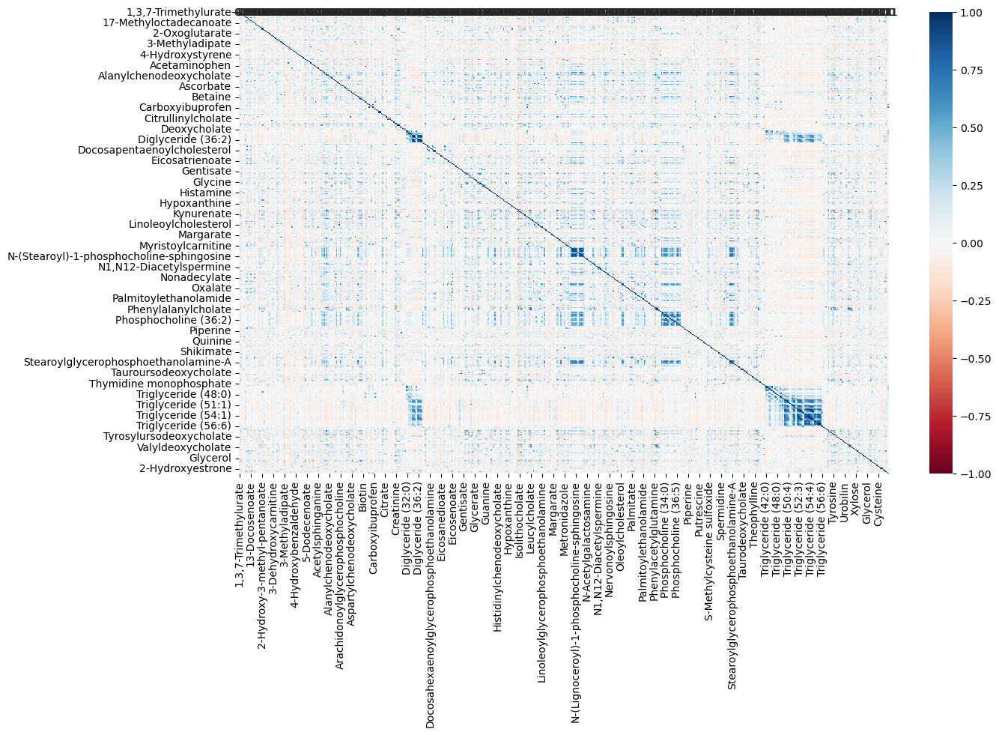

In [5]:
# plot heatmap with correlation matrix
plt.figure(figsize=(14,8))
sns.heatmap(corr_mat,  annot=True, fmt=".1f", vmin=-1,vmax=1, cmap='RdBu')

In [6]:
# look at the correlation matrix
corr_mat

,"1,3,7-Trimethylurate",1-Methylguanine,1-Methylguanosine,1-Methylhistamine,1-Methylnicotinamide,10-Heptadecenoate,10-Nonadecenoate,11-Methyllaurate,"12,13-Dihydroxyoctadecenoate",13-Docosenoate,...,Cholecalciferol,Cysteine,gamma-Linolenate,16a-Hydroxyestrone,2-Hydroxyestrone,Cortisone,Cortisol.1,21-Deoxycortisol.1,20alpha-Hydroxycholesterol,Cholesterol sulfate
"1,3,7-Trimethylurate",1.000000,-0.083865,-0.044646,-0.013762,-0.070399,-0.020808,-0.056565,0.125058,-0.101387,0.003516,...,-0.162939,-0.035663,-0.039286,-0.071345,-0.071127,0.074793,0.081612,-0.011915,0.010575,-0.057550
1-Methylguanine,-0.083865,1.000000,0.144161,0.052965,0.088325,0.009227,0.115767,-0.193907,0.250743,0.124086,...,0.238999,-0.012689,-0.032365,0.111689,0.111829,-0.111038,-0.015348,0.225214,0.048400,0.009859
1-Methylguanosine,-0.044646,0.144161,1.000000,-0.034552,0.131844,0.077946,0.086819,-0.083625,0.043284,0.093833,...,-0.045379,0.007471,-0.000672,-0.012286,-0.012145,-0.055887,0.180079,0.230645,0.024986,-0.037367
1-Methylhistamine,-0.013762,0.052965,-0.034552,1.000000,0.009358,0.054638,0.042206,-0.092468,0.034476,0.057755,...,0.071218,-0.034927,0.025161,-0.032169,-0.032251,-0.044995,0.012165,0.020091,-0.002881,0.005986
1-Methylnicotinamide,-0.070399,0.088325,0.131844,0.009358,1.000000,-0.027309,-0.016399,-0.016947,-0.044158,-0.047110,...,-0.022567,-0.026735,-0.012995,-0.057570,-0.058687,0.029571,-0.064557,-0.047036,0.027299,-0.013031
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Cortisone,0.074793,-0.111038,-0.055887,-0.044995,0.029571,0.060119,-0.062412,0.151394,-0.142676,-0.042578,...,-0.013197,-0.010012,-0.043430,-0.086648,-0.086331,1.000000,0.174074,-0.019304,-0.124541,0.062970
Cortisol.1,0.081612,-0.015348,0.180079,0.012165,-0.064557,0.287288,0.094889,0.074483,0.124390,0.194737,...,-0.106275,0.036960,0.326971,-0.038953,-0.038791,0.174074,1.000000,0.324419,-0.073660,0.045701
21-Deoxycortisol.1,-0.011915,0.225214,0.230645,0.020091,-0.047036,0.314206,0.427450,0.001768,0.186948,0.284725,...,0.002801,0.099002,0.185998,-0.081088,-0.080344,-0.019304,0.324419,1.000000,0.038286,-0.031298
20alpha-Hydroxycholesterol,0.010575,0.048400,0.024986,-0.002881,0.027299,-0.199912,-0.147785,-0.169721,-0.021563,-0.192962,...,-0.077098,-0.104303,-0.123457,0.000901,0.001434,-0.124541,-0.073660,0.038286,1.000000,-0.073779


In [7]:
# To evaluate if data is mostly linear or non-linear, find the proportion of correlation coefficients less than 0.2 which indicates very low (negligible) correlations
# Set the diagonal elements to NaN to exclude self-to-self correlations
np.fill_diagonal(corr_mat.values, np.nan)

# Flatten the correlation matrix to a 1D array, ignoring NaN values
flattened_corr = corr_mat.values.flatten()

# Count the total number of correlation coefficients (excluding NaN values)
total_corr_coefficients = np.sum(~np.isnan(flattened_corr))

# Count the number of correlation coefficients less than 0.2 (absolute value)
count_less_02 = np.sum(np.abs(flattened_corr[~np.isnan(flattened_corr)]) < 0.2)
percent = (count_less_02/total_corr_coefficients)*100

print("Total number of correlation coefficients (excluding self-to-self):", total_corr_coefficients)
print("Number of correlation coefficients less than 0.2:", count_less_02)
print("Proportion of correlation coefficients less than 0.2:", percent, "%")

Total number of correlation coefficients (excluding self-to-self): 271962
Number of correlation coefficients less than 0.2: 247746
Proportion of correlation coefficients less than 0.2: 91.0958148564873 %


<Axes: xlabel='Triglyceride (56:6)', ylabel='Triglyceride (54:1)'>

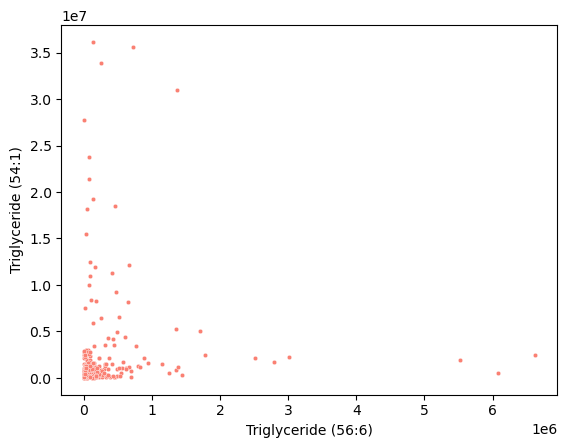

In [17]:
sns.scatterplot(x=train["Triglyceride (56:6)"], y=train["Triglyceride (54:1)"], color="salmon", s=10)
# sns.lineplot(data=train, x="1,3,7-Trimethylurate",y="1-Methylguanine",color="skyblue")

<Axes: xlabel='Triglyceride (56:6)', ylabel='Triglyceride (52:3)'>

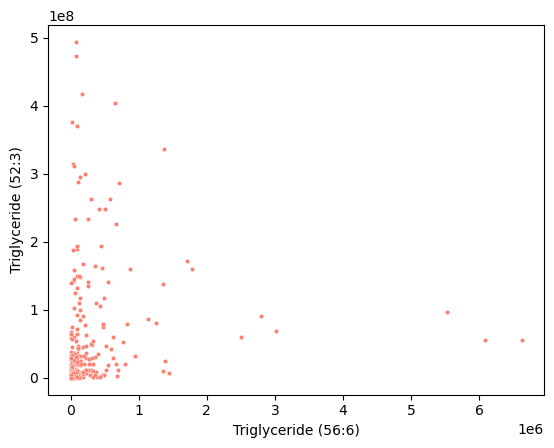

In [18]:
sns.scatterplot(x=train["Triglyceride (56:6)"], y=train["Triglyceride (52:3)"], color="salmon", s=10)

<Axes: xlabel='Triglyceride (48:0)', ylabel='Triglyceride (42:0)'>

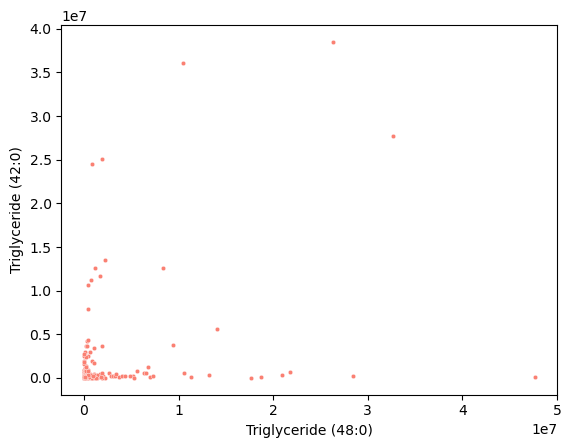

In [19]:
sns.scatterplot(x=train["Triglyceride (48:0)"], y=train["Triglyceride (42:0)"], color="salmon", s=10)

In [27]:
## Most of the variables have negligible correlation coefficient, indicating non-linearity

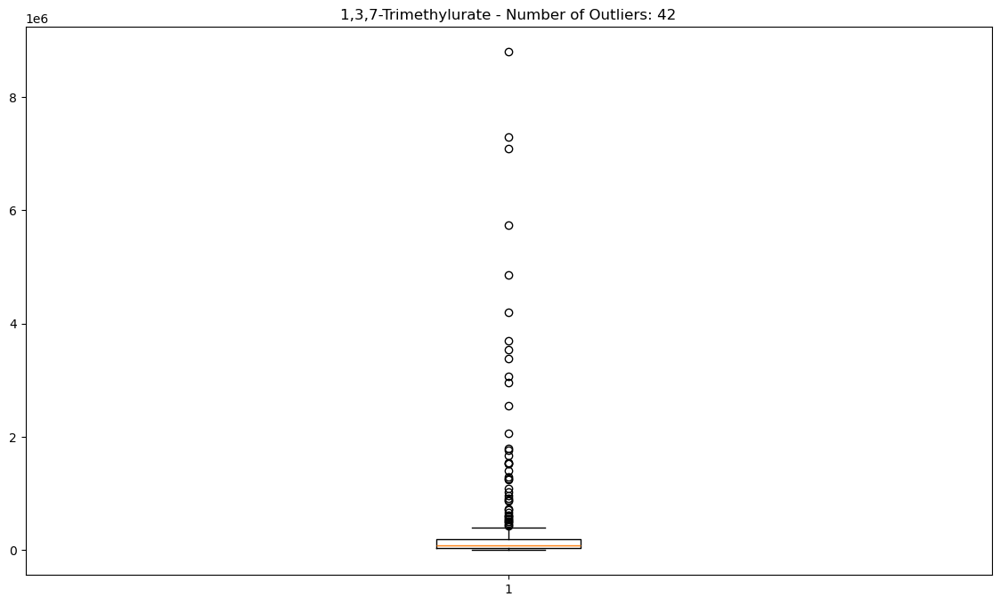

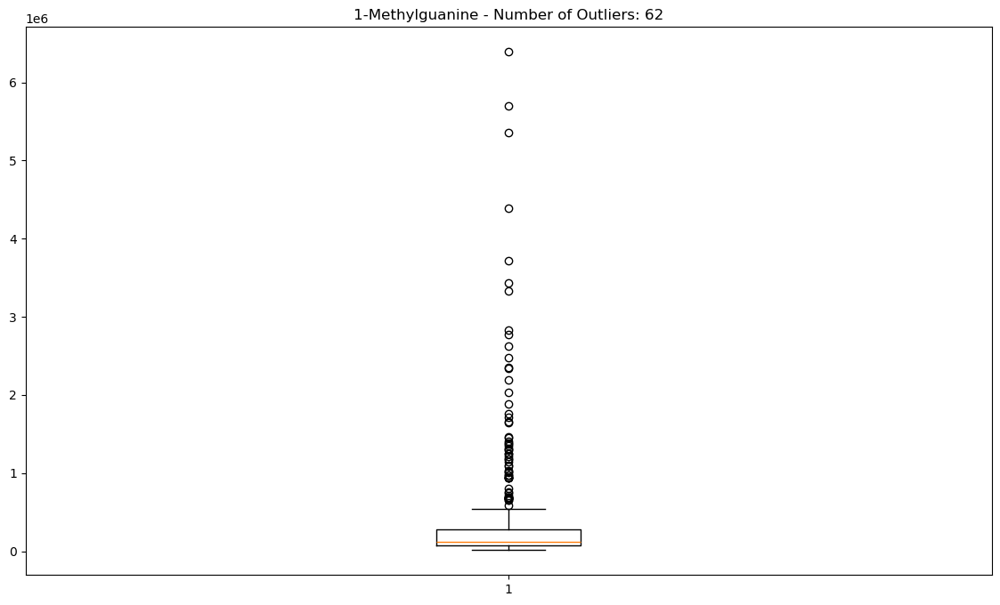

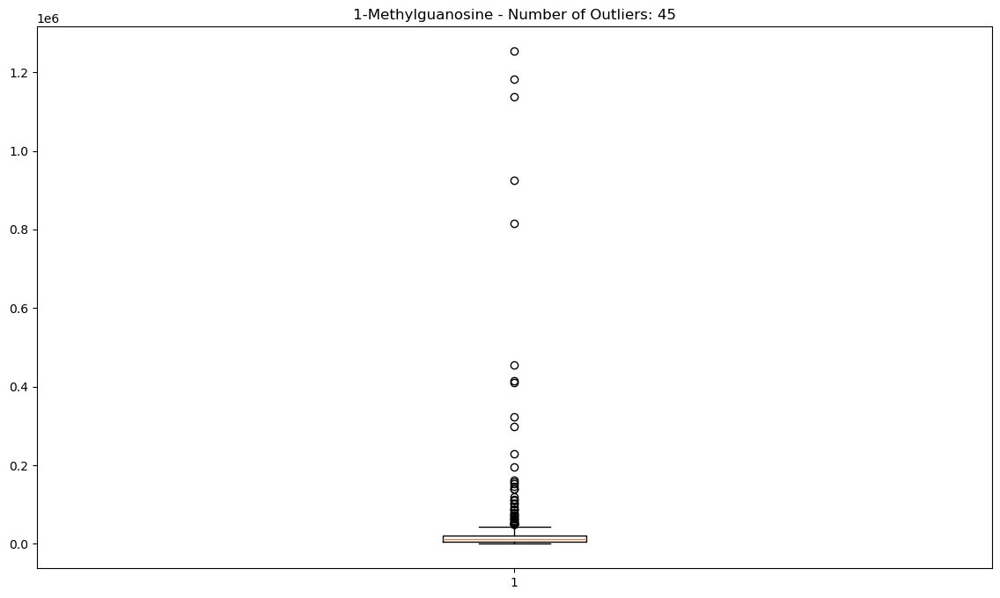

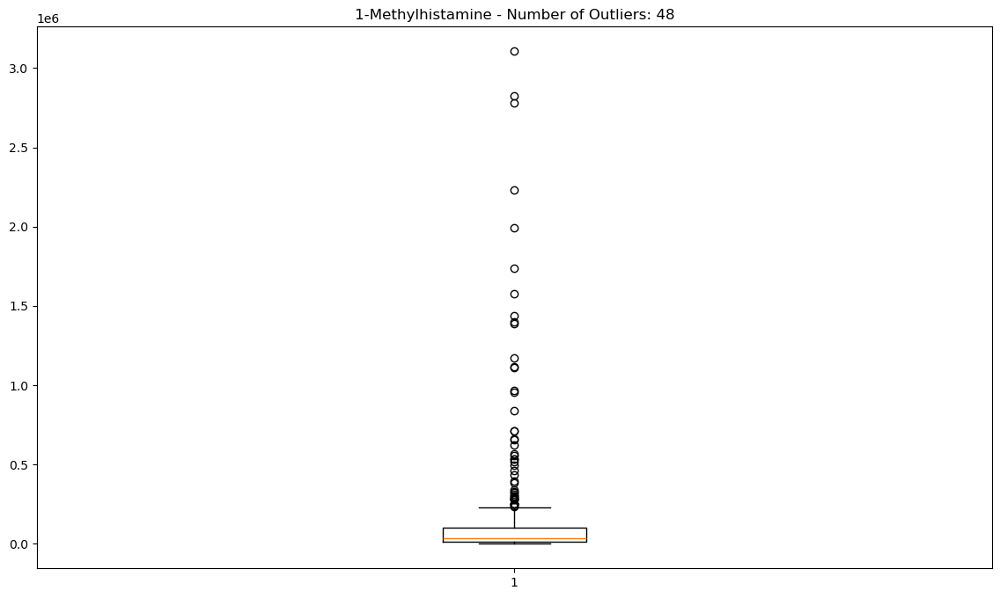

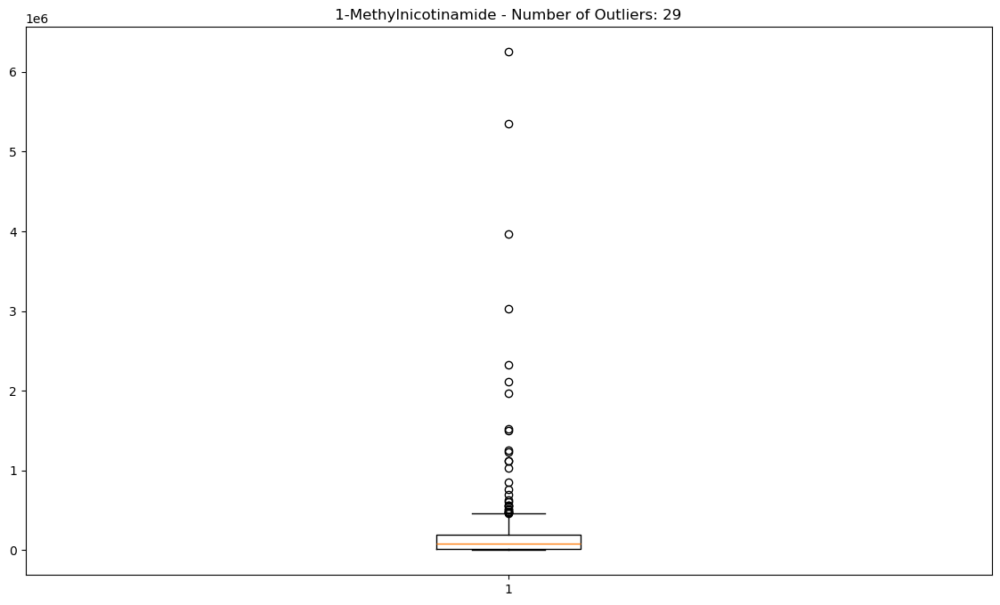

...

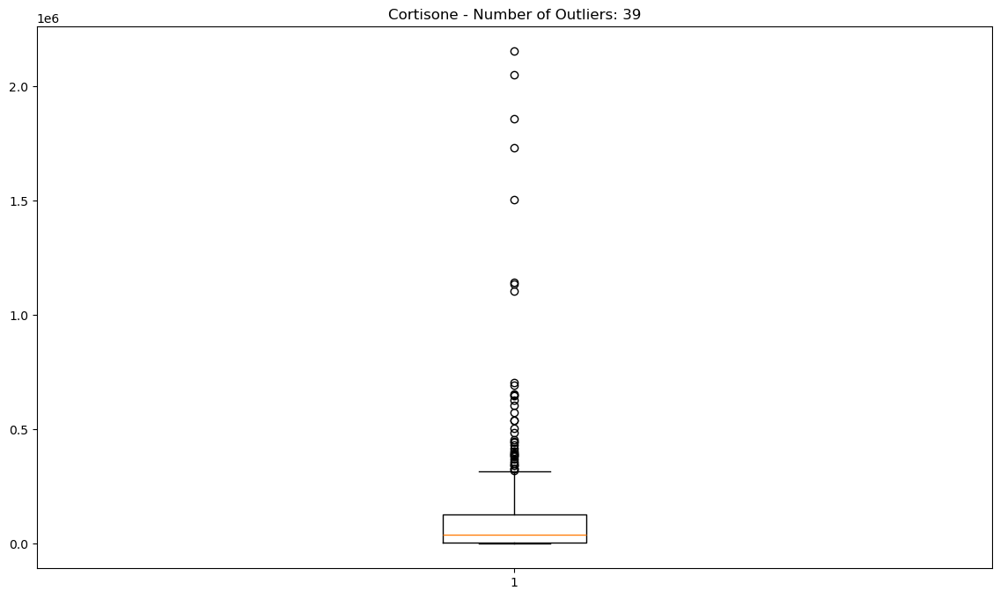

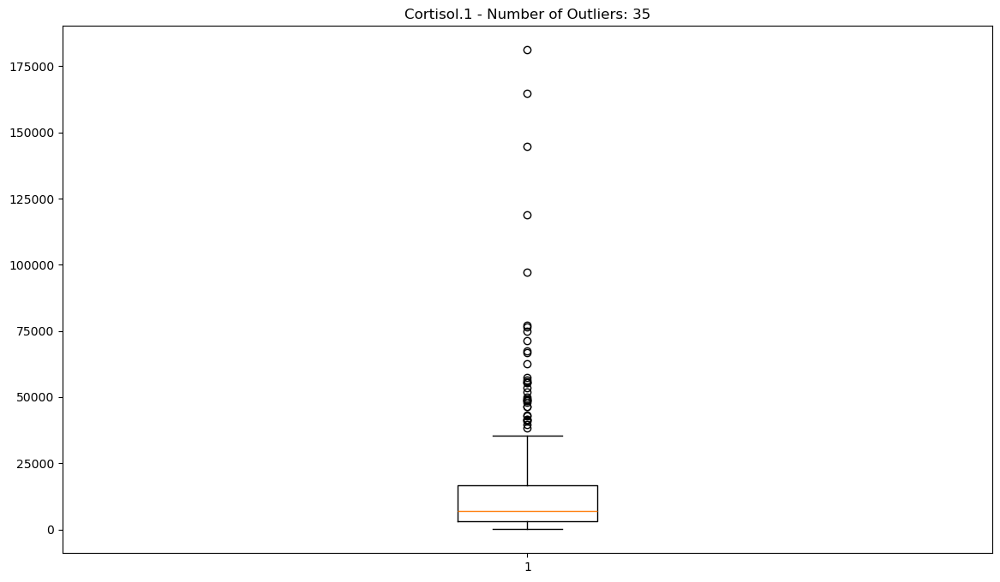

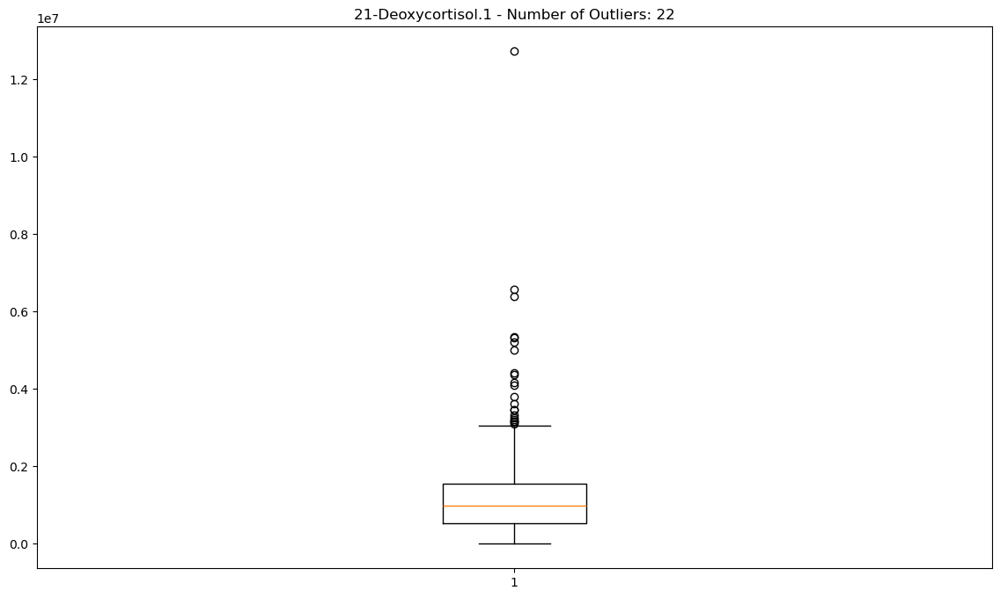

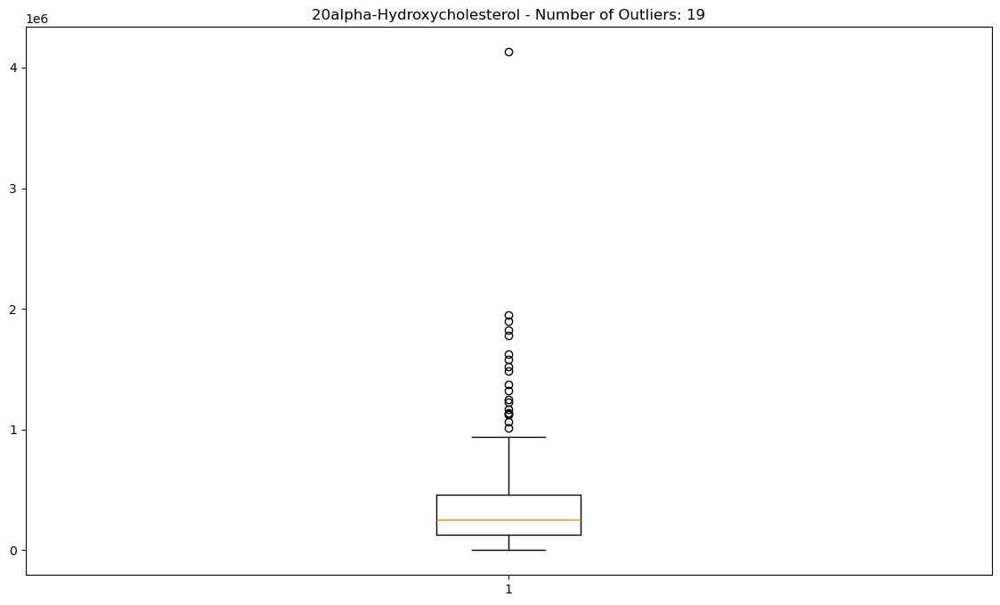

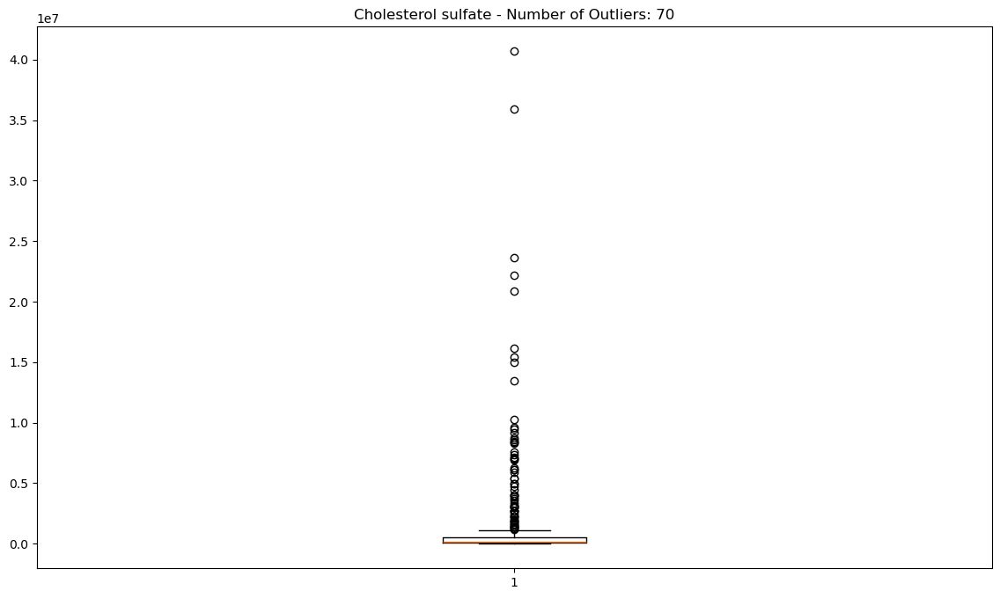

In [25]:
# Initialize a counter for columns with more than 20 outliers
count_columns_with_many_outliers = 0
# Initialize a counter for columns with more than 40 outliers
count_columns_with_many_outliers_40 = 0

# draw a boxplot to see if there's a lot of outlier 
#decided not to remove them as many outliers may mean they contain antural variation themselves
for i in train.iloc[:,6:].columns:
    
     # Calculate Q1 (25th percentile) and Q3 (75th percentile)
    Q1 = train[i].quantile(0.25)
    Q3 = train[i].quantile(0.75)

    # Compute the Interquartile Range (IQR)
    IQR = Q3 - Q1

    # Determine the lower and upper bounds for outliers
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Count the number of outliers
    outliers = ((train[i] < lower_bound) | (train[i] > upper_bound)).sum()
    
     # Check if the number of outliers is greater than 20
    if outliers > 20:
        count_columns_with_many_outliers += 1
         
    # Check if the number of outliers is greater than 40
    if outliers > 40:
        count_columns_with_many_outliers_40 += 1    

    # Plot the boxplot
    plt.figure(figsize=(14, 8))
    plt.boxplot(train[i])
    plt.title(f'{i} - Number of Outliers: {outliers}')
    plt.show()

In [26]:
print(f'Number of box plots with more than 20 outliers: {count_columns_with_many_outliers}')
print(f'Number of box plots with more than 40 outliers: {count_columns_with_many_outliers_40}')

Number of box plots with more than 20 outliers: 475
Number of box plots with more than 40 outliers: 282


In [29]:
## As there are many outliers in more than half of the variables, there outliers may contain natural variation with a trend themselves
## thus, decided not to exclude them

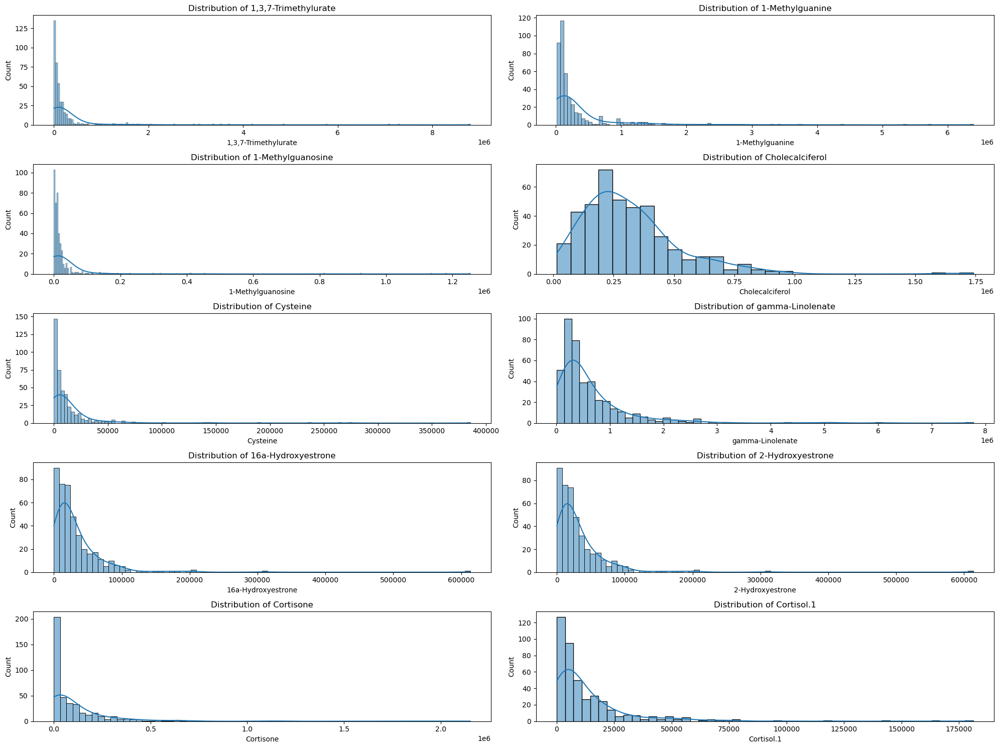

In [33]:
# Select a subset of features for visualization
features_to_plot = [
    '1,3,7-Trimethylurate', '1-Methylguanine', '1-Methylguanosine', 
    'Cholecalciferol', 'Cysteine', 'gamma-Linolenate', 
    '16a-Hydroxyestrone', '2-Hydroxyestrone', 'Cortisone', 'Cortisol.1'
]

# Create histograms for the selected features to see data distribution
plt.figure(figsize=(20, 15))
for i, feature in enumerate(features_to_plot, 1):
    plt.subplot(5, 2, i)
    sns.histplot(train[feature], kde=True)
    plt.title(f'Distribution of {feature}')
plt.tight_layout()
plt.show()

In [35]:
## Variables not normally distributed -> not going to use StandardScaler()

In [8]:
#scale the data without metadata column
# Used MinMax scaler as the data is not normally distributed and to preserve the shape of the distribution 
scaler = MinMaxScaler()
train_scaled = scaler.fit_transform(train.iloc[:, 6:])
test_scaled = scaler.transform(test.iloc[:, 3:])

In [9]:
# random_state
CID=517

In [10]:
# Create a dataframe with train data and the scaled data
scaled_df = pd.DataFrame(train_scaled)
scaled_df['group'] = train.group

# Split the data into training and test sets
X_train_scaled, X_test_scaled, y_train_scaled, y_test_scaled = train_test_split(scaled_df.iloc[:,:-1], scaled_df.group, test_size=0.2, random_state=CID)

In [59]:
# Create a pipeline with MinMaxScaler, UMAP, and XGBoostClassifier -> based on the gridsearch result suggesting the highest accuracy score with XGBoostClassifier and MinMaxScaler()
pipeline = Pipeline([
    ('scaler', MinMaxScaler()),
    ('umap', umap.UMAP()),
    ('classifier', xgb.XGBClassifier())
])

# Set up the parameter grid for the pipeline
# with these  'umap__n_neighbors': [5, 10, 15, 20, 25, 30],'umap__min_dist': [0.0, 0.1, 0.2, 0.3, 0.4, 0.5],'classifier__n_estimators': [50, 100, 150]
# 5, 0.3, 100 was best parameter
param_grid = {
    'umap__n_neighbors': [5, 10, 15],
    'umap__min_dist': [0.2, 0.3, 0.4],
    'classifier__n_estimators': [100, 150]
}

# Perform grid search
grid_search = GridSearchCV(pipeline, param_grid, cv=5, n_jobs=-1, scoring='accuracy')
grid_search.fit(X_train_scaled, y_train_scaled)

# Output the best parameters and the best score
print(f"Best parameters: {grid_search.best_params_}")
print(f"Best score: {grid_search.best_score_:.4f}")

Best parameters: {'classifier__n_estimators': 100, 'umap__min_dist': 0.4, 'umap__n_neighbors': 5}
Best score: 0.6165


In [67]:
# perform UMAP and project onto the scaled IBD data
# correlation matrix shows data is mostly non-linear
# parameters decided by the pipeline above and visual inspection  
UMAP_embedding = umap.UMAP(n_components=2, min_dist=0.3, n_neighbors =5, metric="euclidean", random_state=CID).fit_transform(train_scaled)

C:\Users\yenju\anaconda3\Lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


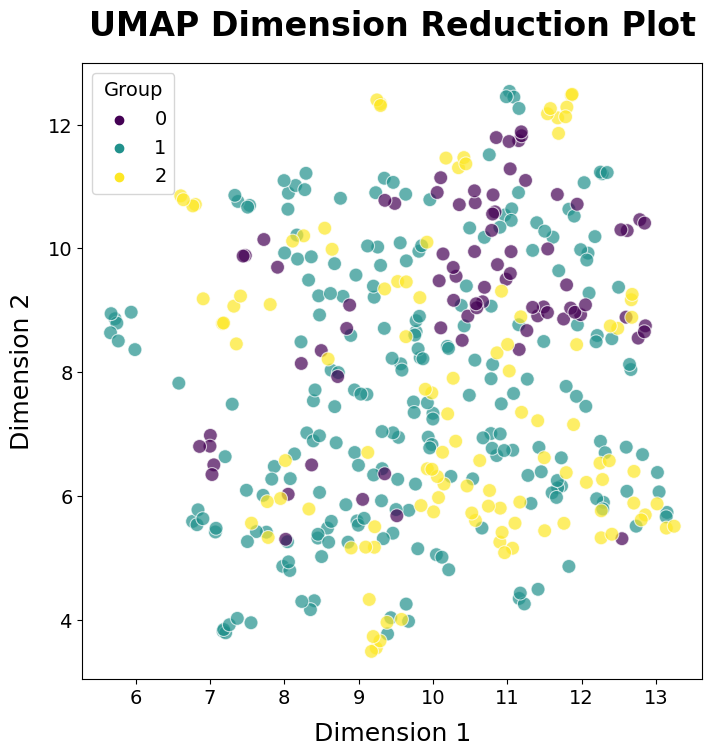

In [68]:
## with several parameter optimisation and 
# plot UMAP embedding
plt.figure(figsize=(8, 8))
p = sns.scatterplot(x=UMAP_embedding[:, 0],
 y=UMAP_embedding[:, 1], 
 hue=train["group"], # change this to colour points by other covariates
 s=100, 
 alpha=0.7, palette = 'viridis') # check what these parameters mean in the documentation, and change them to your liking

p.set_xlabel("Dimension 1", fontsize =18, labelpad=10)
p.set_ylabel("Dimension 2", fontsize =18, labelpad=10)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.title("UMAP Dimension Reduction Plot", fontsize=24, pad=20, weight='bold')
plt.legend(title='Group', fontsize=14, title_fontsize=14, loc='upper left')

plt.show()

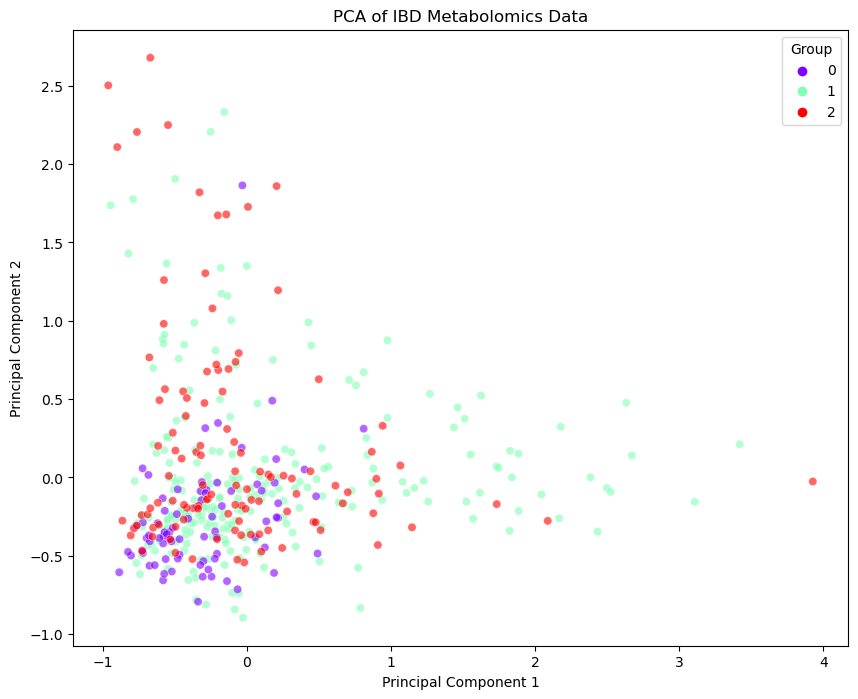

In [50]:
## Validation with other dimension reduction method
# Perform PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(train_scaled)

# Create a DataFrame with PCA results
pca_df = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2'])

pca_df['group'] = train['group']

# Plot PCA results
plt.figure(figsize=(10, 8))
sns.scatterplot(x='PC1', y='PC2', hue='group', data=pca_df, palette='rainbow', alpha=0.6)
plt.title('PCA of IBD Metabolomics Data')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Group')
plt.show()

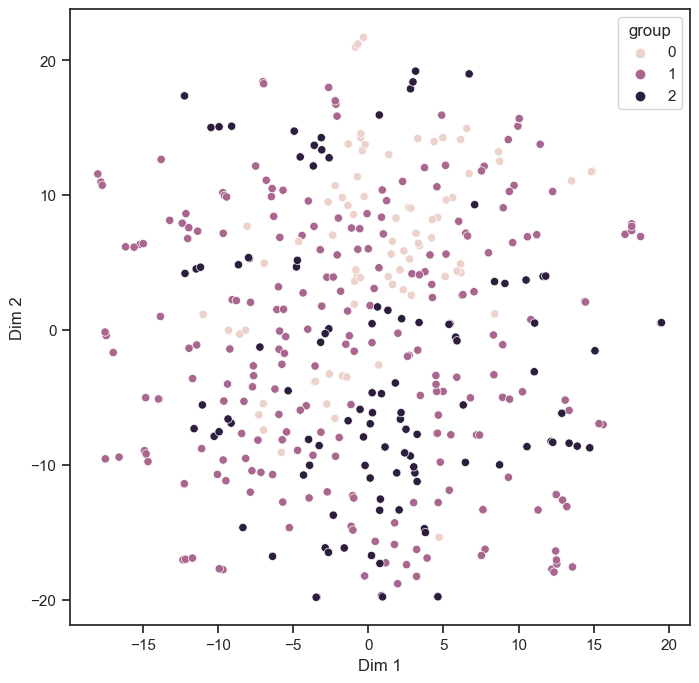

In [51]:
# perfrom t-SNE with default parameters
tsne_embedding = TSNE(n_components=2, learning_rate='auto', init='random').fit_transform(train_scaled)

# plot a graph
sns.set_style("ticks")
sns.set_context("notebook")
sns.set_palette("Paired")
plt.figure(figsize=(8, 8))

p = sns.scatterplot(x=tsne_embedding[:, 0],
 y=tsne_embedding[:, 1], 
 hue=train["group"])

p.set_xlabel("Dim 1")
p.set_ylabel("Dim 2")

plt.show()

In [11]:
## all 3 plots show significantly overlapping cluster with no distinct boundaries bwn the groups (subtle group differences)
## this consistency suggests that the group differences are influenced by complex, non-linear data structure
## UMAP and t-SNE have slightly better clustering than PCA, suggesting non-linear models could be more effective for classification tasks
## simple dimension reduction methods can not clearly separate the groups
## thus, use more advanced machine learning models, such as XGBoost, Random Forest, or SVM, which can handle complex, non-linear relationships better

Group            0    1   2
DBSCAN Cluster             
-1               0    3   0
 0               0    7   0
 1              74  200  92
 2               0    4   0
 3               0    6   0
 4               0    4   0
 5               5    1   0
 6               0    4   7
 7               0    3   0
 8               0    0   4
 9               0    0   3
 10              0    0   7


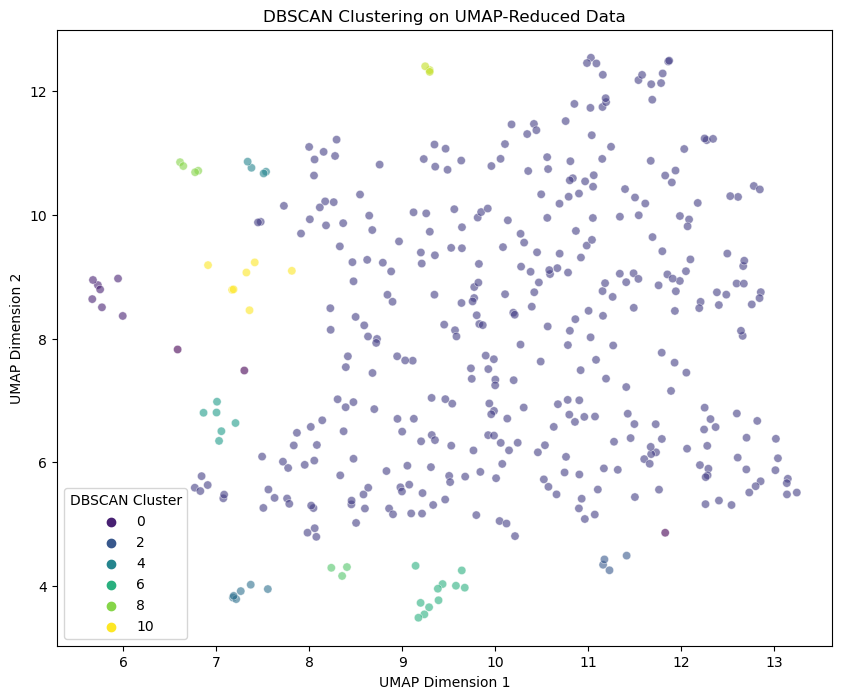

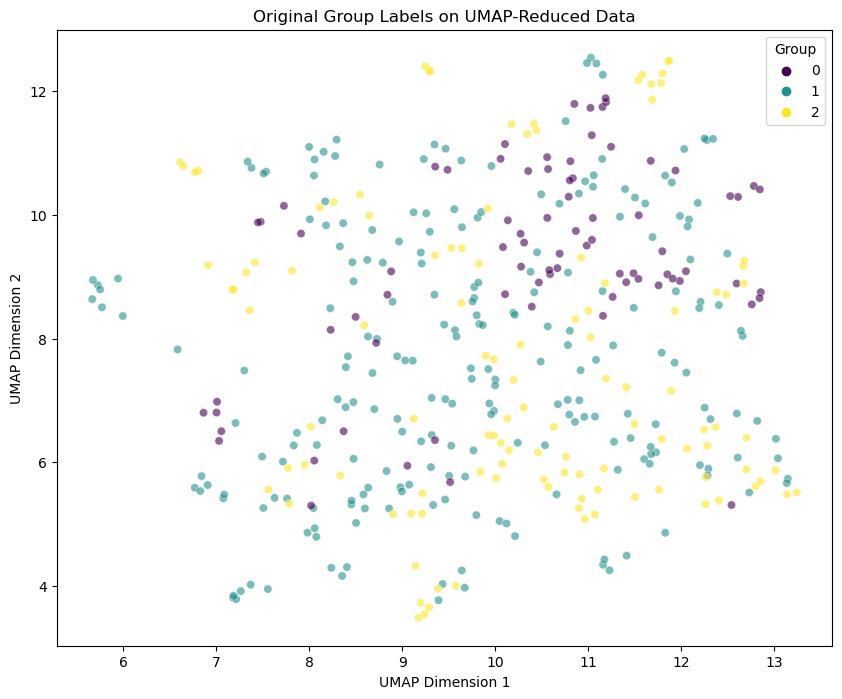

In [49]:
# Apply DBSCAN for clustering
dbscan = DBSCAN(eps=0.5, min_samples=3)
dbscan_labels = dbscan.fit_predict(UMAP_embedding)

# Add the DBSCAN labels to a DataFrame
umap_df = pd.DataFrame(UMAP_embedding, columns=['UMAP Dim 1', 'UMAP Dim 2'])
umap_df['DBSCAN Cluster'] = dbscan_labels
umap_df['Group'] = train.group.values  # Assuming 'train.group' contains the original group labels

# Create a contingency table
contingency_table = pd.crosstab(umap_df['DBSCAN Cluster'], umap_df['Group'])
print(contingency_table)

# Plot DBSCAN clustering results
plt.figure(figsize=(10, 8))
sns.scatterplot(x='UMAP Dim 1', y='UMAP Dim 2', hue='DBSCAN Cluster', palette='viridis', data=umap_df, alpha=0.6)
plt.title('DBSCAN Clustering on UMAP-Reduced Data')
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.legend(title='DBSCAN Cluster')
plt.show()

# Plot the original group labels for comparison
plt.figure(figsize=(10, 8))
sns.scatterplot(x='UMAP Dim 1', y='UMAP Dim 2', hue='Group', palette='viridis', data=umap_df, alpha=0.6)
plt.title('Original Group Labels on UMAP-Reduced Data')
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.legend(title='Group')
plt.show()

In [69]:
# Apply Gaussian Mixture Model (GMM)
gmm = GaussianMixture(n_components=3, covariance_type="diag",random_state=CID)  # Set n_components as needed
gmm_labels = gmm.fit_predict(UMAP_embedding)

# Add the GMM labels to a DataFrame
umap_df = pd.DataFrame(UMAP_embedding, columns=['UMAP Dim 1', 'UMAP Dim 2'])
umap_df['GMM Cluster'] = gmm_labels
umap_df['Group'] = train.group.values  # Assuming 'train.group' contains the original group labels

C:\Users\yenju\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


In [70]:
# Create a contingency table
contingency_table = pd.crosstab(umap_df['GMM Cluster'], umap_df['Group'])
print(contingency_table)

Group         0    1   2
GMM Cluster             
0            12  119  64
1            11   59  24
2            56   54  25


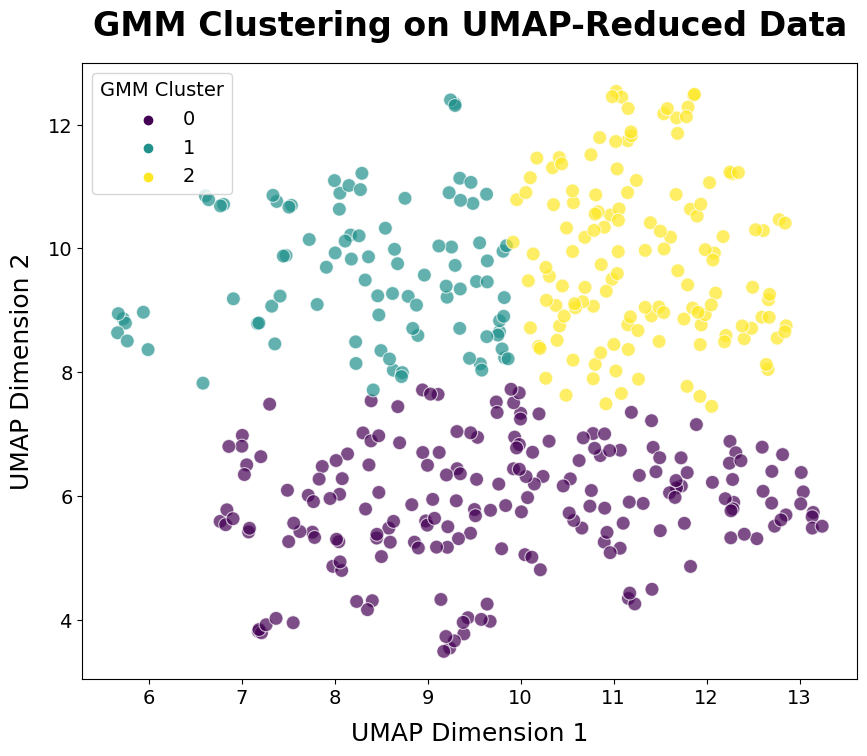

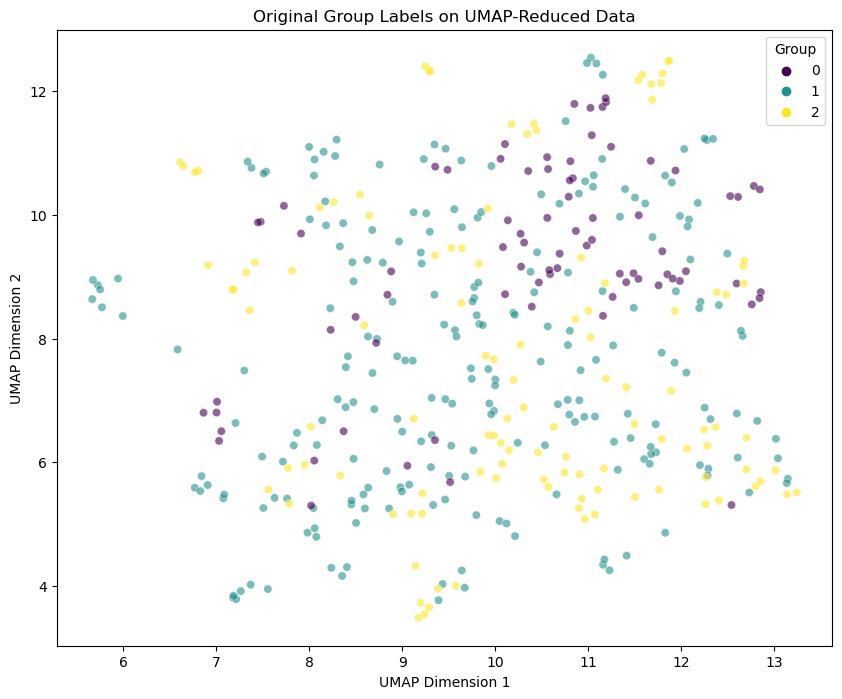

In [71]:
# Plot GMM clustering results
plt.figure(figsize=(10, 8))
sns.scatterplot(x='UMAP Dim 1', y='UMAP Dim 2', hue='GMM Cluster', palette='viridis', data=umap_df, s=100, alpha=0.7)
plt.title('GMM Clustering on UMAP-Reduced Data', fontsize=24, pad=20, weight='bold')
plt.xlabel('UMAP Dimension 1', fontsize =18, labelpad=10)
plt.ylabel('UMAP Dimension 2', fontsize =18, labelpad=10)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(title='GMM Cluster', fontsize=14, title_fontsize=14)
plt.show()

# Plot the original group labels for comparison
plt.figure(figsize=(10, 8))
sns.scatterplot(x='UMAP Dim 1', y='UMAP Dim 2', hue='Group', palette='viridis', data=umap_df, alpha=0.6)
plt.title('Original Group Labels on UMAP-Reduced Data')
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.legend(title='Group')
plt.show()

In [12]:
## GMM successfully identified three distinct clusters in the UMAP reduced data
## Cluster 0 has high purity for Group 1 from original data (119 points)
## There is some overlap among original groups

In [17]:
# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(train.iloc[:,6:], train.group, test_size=0.2, random_state=CID)

# Define the scalers
scalers = {
    'StandardScaler': StandardScaler(),
    'RobustScaler': RobustScaler(),
    'MinMaxScaler': MinMaxScaler()
}

# Define the model parameters for GridSearch
param_grids = {
    'RandomForest': {
        'n_estimators': [100, 200],
        'max_depth': [10, 20, None],
        'min_samples_split': [2, 5, 10]
    },
    'Ridge': {
        'alpha': [0.1, 1.0, 10.0]
    },
    'MLP': {
        'hidden_layer_sizes': [(50,), (100,), (100, 50)],
        'activation': ['tanh', 'relu'],
        'solver': ['adam', 'sgd'],
        'alpha': [0.0001, 0.001],
        'learning_rate': ['constant', 'adaptive']
    },
    'SLP': {
        'hidden_layer_sizes': [()],
        'activation': ['tanh', 'relu'],
        'solver': ['adam', 'sgd'],
        'alpha': [0.0001, 0.001],
        'learning_rate': ['constant', 'adaptive']
    },
    'XGBoost': {
        'n_estimators': [100, 200],
        'max_depth': [3, 6, 10],
        'learning_rate': [0.01, 0.1, 0.2]
    }
}

# Define the models
models = {
    'RandomForest': RandomForestClassifier(random_state=CID),
    'Ridge': RidgeClassifier(),
    'MLP': MLPClassifier(max_iter=500, random_state=CID),
    'SLP': MLPClassifier(hidden_layer_sizes=(), max_iter=500, random_state=CID),
    'XGBoost': xgb.XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')
}

# Dictionary to store the results
results = []

# Loop through each scaler
for scaler_name, scaler in scalers.items():
    # Scale the data
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    
    # Loop through each model
    for model_name, model in models.items():
        # Perform GridSearchCV to find the best parameters
        grid_search = GridSearchCV(model, param_grids[model_name], cv=10, n_jobs=-1)
        grid_search.fit(X_train_scaled, y_train)
        
        # Train the best model
        best_model = grid_search.best_estimator_
        best_model.fit(X_train_scaled, y_train)
        
        # Predict the test set
        y_pred = best_model.predict(X_test_scaled)
        
        # Calculate accuracy
        accuracy = accuracy_score(y_test, y_pred)
        
        # Store the result
        results.append({
            'Scaler': scaler_name,
            'Model': model_name,
            'Accuracy': accuracy,
            'Best Params': grid_search.best_params_
        })

# Convert results to DataFrame
results_all = pd.DataFrame(results)


results_all

C:\Users\yenju\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\yenju\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\yenju\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
8 fits failed out of a total of 480.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
8 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\

,Scaler,Model,Accuracy,Best Params
0,StandardScaler,RandomForest,0.776471,"{'max_depth': None, 'min_samples_split': 10, '..."
1,StandardScaler,Ridge,0.729412,{'alpha': 10.0}
2,StandardScaler,MLP,0.858824,"{'activation': 'relu', 'alpha': 0.0001, 'hidde..."
3,StandardScaler,SLP,0.835294,"{'activation': 'tanh', 'alpha': 0.0001, 'hidde..."
4,StandardScaler,XGBoost,0.882353,"{'learning_rate': 0.2, 'max_depth': 3, 'n_esti..."
5,RobustScaler,RandomForest,0.776471,"{'max_depth': None, 'min_samples_split': 10, '..."
6,RobustScaler,Ridge,0.600000,{'alpha': 10.0}
7,RobustScaler,MLP,0.694118,"{'activation': 'tanh', 'alpha': 0.0001, 'hidde..."
8,RobustScaler,SLP,0.694118,"{'activation': 'tanh', 'alpha': 0.0001, 'hidde..."
9,RobustScaler,XGBoost,0.882353,"{'learning_rate': 0.2, 'max_depth': 3, 'n_esti..."


In [13]:
# XGBoost + MinMaxScaler combination has highest accuracy
# decided to use XGBoost

In [24]:
# Parameter tuning for XGBoost
# Define the parameter grid for XGBoost
param_grid_xgb = {
    'n_estimators': [100],
    'max_depth': [1],
    'learning_rate': [0.25, 0.3, 0.35, 0.4],
    'subsample': [0.8],
    'colsample_bytree': [0.1, 0.15, 0.2]
}

# Initialize the XGBoost model
xgb_model = xgb.XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')

# Dictionary to store the results
results = []


 # Perform GridSearchCV to find the best parameters for XGBoost
grid_search = GridSearchCV(xgb_model, param_grid_xgb, cv=10, n_jobs=-1)
grid_search.fit(X_train_scaled, y_train_scaled)
    
# Train the best model
best_xgb_model = grid_search.best_estimator_
best_xgb_model.fit(X_train_scaled, y_train_scaled)
    
# Predict the test set
y_pred_scaled = best_xgb_model.predict(X_test_scaled)
    
# Calculate accuracy
accuracy = accuracy_score(y_test_scaled, y_pred_scaled)
    
# Store the result
results.append({
    'Accuracy': accuracy,
    'Best Params': grid_search.best_params_
})

# Convert results to DataFrame
results_xg = pd.DataFrame(results)

# Display the results

results_xg

,Accuracy,Best Params
0,0.917647,"{'colsample_bytree': 0.15, 'learning_rate': 0...."


In [25]:
xg_para = pd.DataFrame(results_xg['Best Params'])
xg_para.to_numpy()

array([[{'colsample_bytree': 0.15, 'learning_rate': 0.4, 'max_depth': 1, 'n_estimators': 100, 'subsample': 0.8}]],
      dtype=object)

In [14]:
## With further tuning in another jupyter notebook just for parameter opitmisation
## & a lot more gridsearch validation, these optimal parameters are chosen
# lets fit the model
clf = xgb.XGBClassifier(
    colsample_bytree=0.1, 
    learning_rate=0.35, 
    max_depth=1, 
    n_estimators=160, 
    subsample= 0.8,
    random_state=42,
    tree_method="approx", 
    enable_categorical=False, 
    use_label_encoder=False, 
    predictor='cpu_predictor'
)
clf.fit(X_train_scaled, y_train_scaled)

C:\Users\yenju\anaconda3\Lib\site-packages\xgboost\core.py:160: UserWarning: [09:17:16] WARNING: D:\bld\xgboost-split_1713397764293\work\src\learner.cc:742: 
Parameters: { "predictor" } are not used.

  warnings.warn(smsg, UserWarning)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.1, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.35, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=1, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=160, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

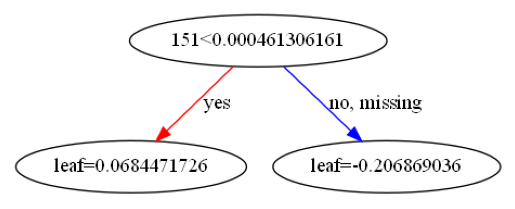

In [15]:
# here you can visualise a tree and plot it (this can also be done for the sklearn functions too)
# Get a graph
graph = xgb.to_graphviz(clf, num_trees=6)

# Or get a matplotlib axis
ax = xgb.plot_tree(clf, num_trees=6)

In [16]:
# now -let's predict a model with out testing set, and also look at feature importances 
y_pred_scaled = clf.predict(X_test_scaled)
display(accuracy_score(y_test_scaled, y_pred_scaled))

# and let's explore some of the attributes, feel free to check more!

clf.get_booster

0.9647058823529412

<bound method XGBModel.get_booster of XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.1, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.35, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=1, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=160, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)>

In [17]:
y_pred_scaled

array([0, 2, 2, 2, 1, 2, 1, 1, 0, 1, 2, 1, 1, 1, 0, 2, 0, 2, 1, 1, 1, 0,
       1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 0, 0, 2, 1, 2, 1, 1, 1, 1, 2, 1, 1,
       1, 1, 1, 1, 2, 1, 0, 2, 2, 0, 0, 1, 2, 1, 0, 1, 2, 1, 2, 0, 0, 1,
       1, 1, 0, 1, 1, 1, 2, 2, 1, 2, 2, 0, 2, 1, 1, 1, 0, 1, 2],
      dtype=int64)

In [18]:
# lets fit the model

clf.fit(train_scaled, train.group)

test_predictions = clf.predict(test_scaled)

# Save the predictions
test['predicted_group'] = test_predictions

# Display the first few predictions
test[['PID', 'predicted_group']]

C:\Users\yenju\anaconda3\Lib\site-packages\xgboost\core.py:160: UserWarning: [09:17:54] WARNING: D:\bld\xgboost-split_1713397764293\work\src\learner.cc:742: 
Parameters: { "predictor" } are not used.

  warnings.warn(smsg, UserWarning)


,PID,predicted_group
0,1001,0
1,1002,1
2,1003,0
3,1004,0
4,1005,1
...,...,...
374,1458,1
375,1460,1
376,1461,0
377,1462,1


In [19]:
excel = test['predicted_group'].to_numpy()
excel

array([0, 1, 0, 0, 1, 0, 1, 0, 0, 2, 1, 0, 1, 0, 2, 1, 0, 0, 0, 0, 2, 1,
       2, 1, 1, 2, 2, 1, 2, 1, 0, 0, 2, 2, 1, 1, 2, 2, 1, 0, 0, 1, 0, 2,
       2, 0, 1, 2, 1, 0, 1, 1, 1, 2, 0, 1, 0, 2, 1, 2, 1, 1, 2, 1, 0, 0,
       0, 0, 1, 1, 0, 1, 0, 1, 2, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 2, 2, 1,
       1, 2, 1, 1, 2, 1, 2, 2, 0, 0, 0, 1, 1, 1, 0, 0, 1, 2, 2, 0, 1, 2,
       0, 0, 2, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 2, 1, 2, 2, 0, 0, 0, 2, 0,
       0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 2, 1, 1, 1, 0, 2, 0, 0, 2, 0, 0,
       0, 0, 2, 2, 0, 1, 1, 2, 1, 2, 1, 1, 2, 1, 0, 0, 1, 0, 1, 2, 2, 2,
       2, 0, 0, 0, 1, 1, 0, 2, 1, 1, 0, 1, 0, 2, 1, 0, 1, 0, 0, 1, 2, 0,
       1, 0, 1, 1, 0, 0, 0, 1, 2, 2, 2, 1, 0, 1, 2, 1, 0, 1, 0, 1, 0, 1,
       1, 1, 0, 0, 1, 1, 0, 1, 1, 2, 0, 0, 1, 2, 1, 0, 1, 0, 1, 1, 2, 1,
       1, 1, 1, 1, 0, 1, 1, 0, 2, 0, 0, 2, 0, 2, 0, 0, 1, 0, 0, 2, 1, 0,
       1, 2, 1, 1, 2, 1, 0, 0, 1, 2, 2, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0,
       0, 1, 0, 2, 1, 1, 1, 2, 1, 2, 1, 0, 0, 0, 1,

In [22]:
import os
# Convert the NumPy array to a DataFrame
excel_df = pd.DataFrame(excel)

excel_df.to_excel("output_2.xlsx")

In [23]:
excel_df

,0
0,0
1,1
2,0
3,0
4,1
...,...
374,1
375,1
376,0
377,1


In [95]:
clf.feature_importances_

array([0.        , 0.00061434, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.00288566, 0.        , 0.00412485, 0.        ,
       0.00232825, 0.        , 0.0037332 , 0.        , 0.        ,
       0.00243566, 0.        , 0.00302556, 0.        , 0.        ,
       0.00067892, 0.00248348, 0.00092461, 0.        , 0.01500757,
       0.        , 0.        , 0.        , 0.00294555, 0.00158241,
       0.        , 0.        , 0.00080657, 0.        , 0.00132459,
       0.0026958 , 0.00522132, 0.        , 0.        , 0.00796316,
       0.        , 0.00328245, 0.00053445, 0.00344839, 0.00595618,
       0.00219943, 0.        , 0.00148187, 0.00095558, 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.01112414, 0.        , 0.00794693, 0.        ,
       0.00206692, 0.        , 0.        , 0.01114253, 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.00060

In [24]:
# Find a feature importance for each class using SHAP
explainer = shap.TreeExplainer(clf)
shap_values=explainer(train_scaled)

In [25]:
np.shape (shap_values.values)

(424, 522, 3)

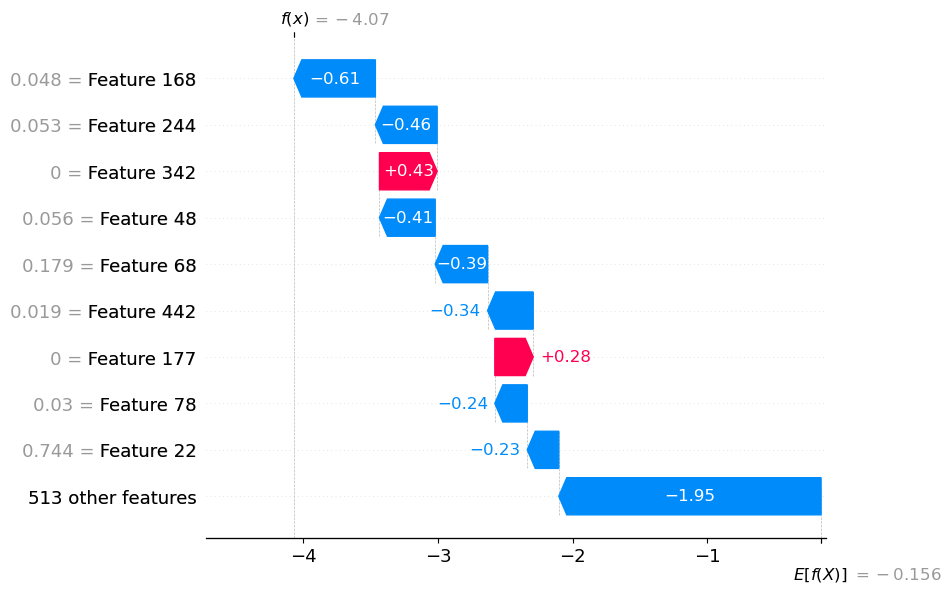

In [26]:
shap.plots.waterfall(shap_values[0,:,0])

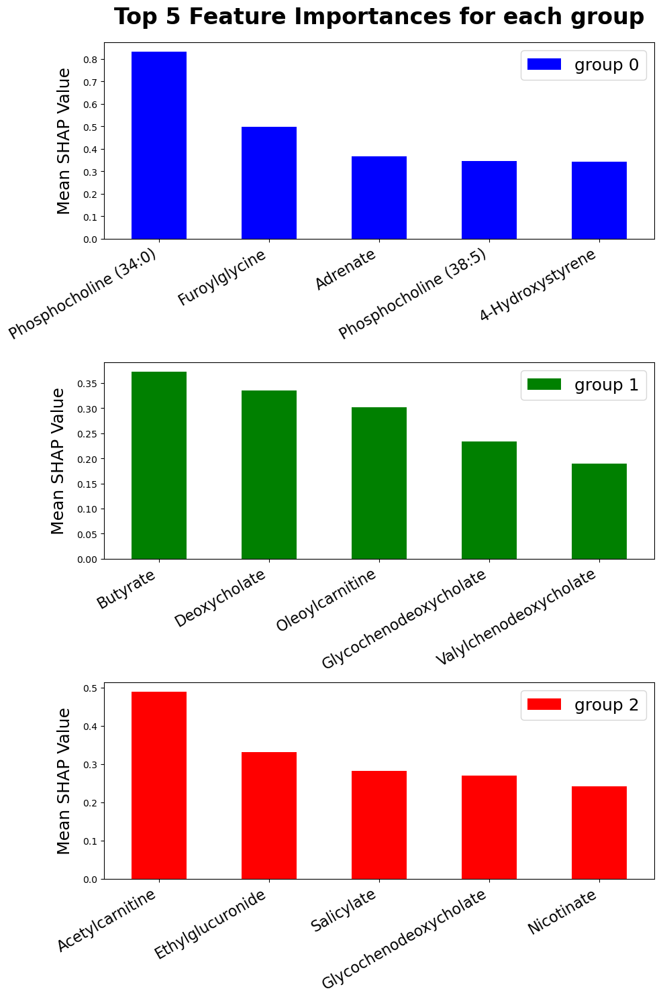

In [27]:
mean_0 = np.mean(np.abs(shap_values.values[:, :, 0]), axis=0)
mean_1 = np.mean(np.abs(shap_values.values[:, :, 1]), axis=0)
mean_2 = np.mean(np.abs(shap_values.values[:, :, 2]), axis=0)
df =pd.DataFrame({"group 0": mean_0, "group 1": mean_1, "group 2": mean_2})

# Find top 5 features with the highest mean SHAP values for each group
top_features_0 = df['group 0'].nlargest(5)
top_features_1 = df['group 1'].nlargest(5)
top_features_2 = df['group 2'].nlargest(5)

# Extract the index values
index_values_0 = top_features_0.index.tolist()
index_values_1 = top_features_1.index.tolist()
index_values_2 = top_features_2.index.tolist()

# Plot top 5 features for each group
fig, ax = plt.subplots(3, 1, figsize=(10, 15))

top_features_0.plot.bar(ax=ax[0], color='blue')
ax[0].set_title("Top 5 Feature Importances for each group", fontsize=24, pad=20, weight='bold')
ax[0].set_ylabel("Mean SHAP Value", fontsize=18, labelpad=10)
ax[0].set_xticklabels(train.iloc[:, 6:].columns[index_values_0], rotation=30, ha='right', fontsize=16)
ax[0].legend(fontsize=18, loc='upper right')

top_features_1.plot.bar(ax=ax[1], color='green')
ax[1].set_ylabel("Mean SHAP Value", fontsize=18, labelpad=10)
ax[1].set_xticklabels(train.iloc[:, 6:].columns[index_values_1], rotation=30, ha='right', fontsize=16)
ax[1].legend(fontsize=18, loc='upper right')

top_features_2.plot.bar(ax=ax[2], color='red')
ax[2].set_ylabel("Mean SHAP Value", fontsize =18, labelpad=10)
ax[2].set_xticklabels(train.iloc[:, 6:].columns[index_values_2], rotation=30, ha='right', fontsize=16)
ax[2].legend(fontsize=18, loc='upper right')

plt.tight_layout()
plt.show()

In [28]:
print(train.iloc[:, 6:].columns[index_values_0])
print(train.iloc[:, 6:].columns[index_values_1])
print(train.iloc[:, 6:].columns[index_values_2])

Index(['Phosphocholine (34:0)', 'Furoylglycine', 'Adrenate',
       'Phosphocholine (38:5)', '4-Hydroxystyrene'],
      dtype='object')
Index(['Butyrate', 'Deoxycholate', 'Oleoylcarnitine', 'Glycochenodeoxycholate',
       'Valylchenodeoxycholate'],
      dtype='object')
Index(['Acetylcarnitine', 'Ethylglucuronide', 'Salicylate',
       'Glycochenodeoxycholate', 'Nicotinate'],
      dtype='object')
